# Overview
This notebook is an Attention U-Net Image Segmentation Model used to detect breat cancer tumors. U-Net is a semantic segmentation technique and attention gates are a simple way to improve U-Net models consistently in a large variety of datasets without a significant overhead in terms of computational cost. Louisiana, my home state in the USA, has the 3rd highest breast cancer death rate in the country. However, with regular screenings, breast cancer can often be found and stopped early. The hope is that with models like this, we can help to detect breast cancer in its early stages and therefore start to address the high death rate from breast cancers at home and abroad. I hope to eventually enhance the model so that it can classify the malignancy of tumors within images. This is both my first image segmentation model and kaggle notebook, so please forgive any errors or anything that isn't clear. With that said, I would be remiss if I didn't mentioned that this model was heavily inspired by DeepNets (Utkarsh Saxena)'s [model](https://www.kaggle.com/code/utkarshsaxenadn/breast-cancer-image-segmentation-attention-unet/notebook#Custom-Callback). I made some edits to the model for my own edification and understanding. 

## Data 
The images are from a Breast Ultrasound Images Dataset, which was collected at baseline include breast ultrasound images among women in ages between 25 and 75 years old. This data was collected in 2018. The number of patients is 600 female patients. The dataset consists of 780 images with an average image size of 500*500 pixels. The images are in PNG format. The ground truth images are presented with original images. The images are categorized into three classes, which are normal, benign, and malignant.

Al-Dhabyani W, Gomaa M, Khaled H, Fahmy A. Dataset of breast ultrasound images. Data in Brief. 2020 Feb;28:104863. DOI: 10.1016/j.dib.2019.104863.

## Imports 
These libraries are being utilized to help create the Attention UNET Model. 

The OS module in Python provides functions for interacting with the operating system, such as reading the current directory or navigating through a particular one. Numpy and pandas allows for linear algebra and data processing, like reading a csv file, respectively. Keras is a high-level, deep learning API used to ease the implementation of neural networks. Similarly, TensorFlow is an open source library for numerical computation that makes machine learning and developing neural networks faster and easier. Glob/glob (short for global) is used to search for files where the filename matches a certain pattern, which will be used to gather all the images for the model. Matplotlib is a comprehensive library for creating static, animated, and interactive visualizations of data. Grad-CAM, or  Gradient-weighted Class Activation Mapping, uses the gradients of any target concept, such as tumors in breast cancers images, flowing into the final convolutional layer to produce a coarse localization map highlighting important regions in the image for predicting the concept.

In [1]:
!pip install tf-explain

You should consider upgrading via the 'C:\Users\212364473\.virtualenvs\LeraningWorkspace-sKozbfXX\Scripts\python.exe -m pip install --upgrade pip' command.


In [2]:
import os
import keras
import numpy as np
import pandas as pd
from glob import glob
import tensorflow as tf
import tensorflow.image as tfi
from tensorflow.keras.utils import to_categorical,load_img, img_to_array
import matplotlib.pyplot as plt
from keras.models import Model
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import UpSampling2D
from keras.layers import concatenate
from keras.layers import Add
from keras.layers import Multiply
from keras.layers import Input
from keras.layers import MaxPool2D
from keras.layers import BatchNormalization
from keras.callbacks import Callback
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from tf_explain.core.grad_cam import GradCAM
from keras.metrics import MeanIoU

## Helper Functions
The below helper funcitons are used to help with the loading and view the images along with their masks. There will also be a few examples following the function declarations for understanding and verification. 

In [3]:
def load_image(image, SIZE):
    return np.round(tfi.resize(img_to_array(load_img(image))/255.,(SIZE, SIZE)),3)

def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]
    
    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))
    
    for i,image in enumerate(image_paths):
        img = load_image(image,SIZE)
        if mask:
            images[i] = img[:,:,:1]
        else:
            images[i] = img
    
    return images

def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

## Loading Images for Model + Sample Images from Dataset 

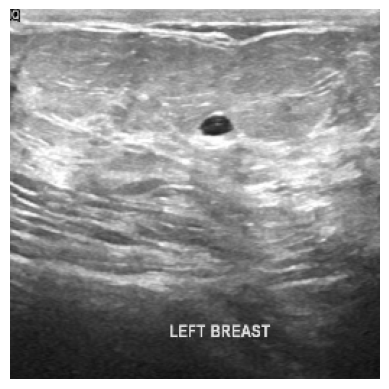

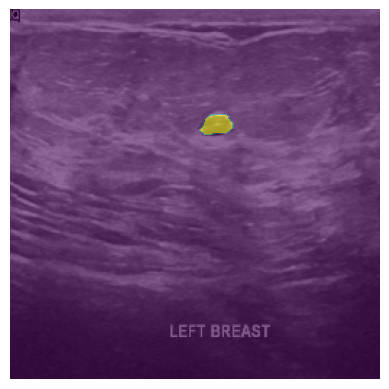

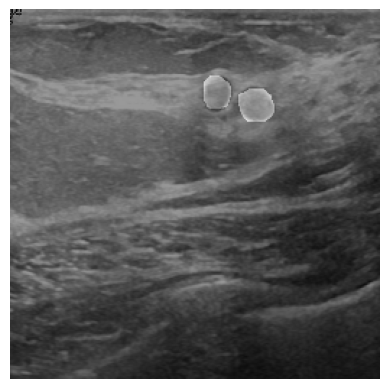

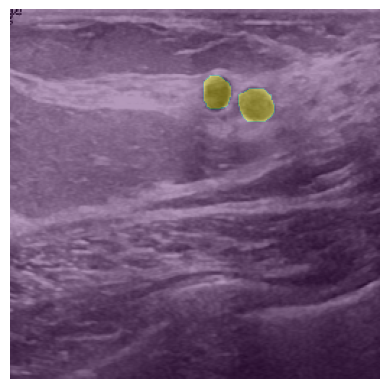

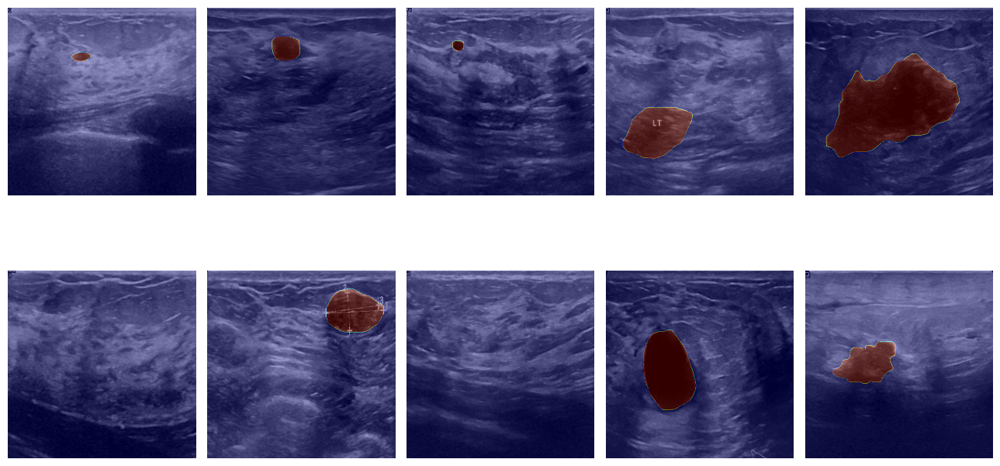

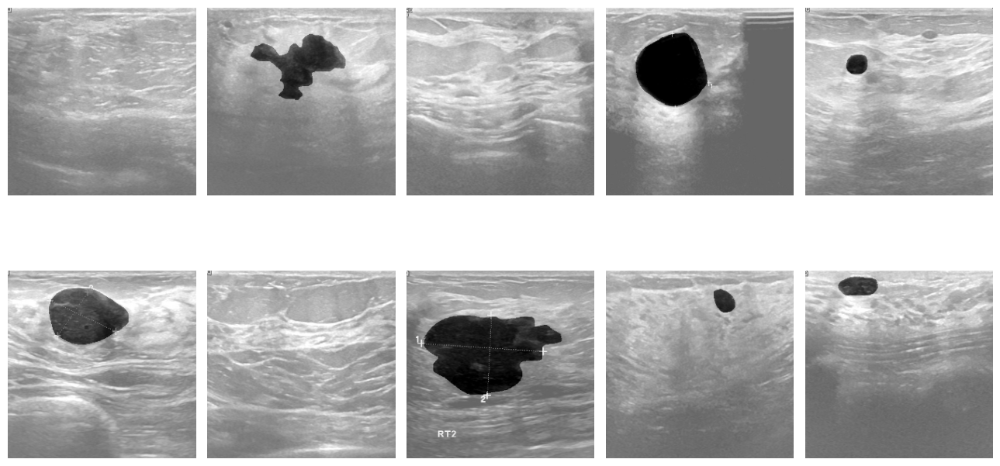

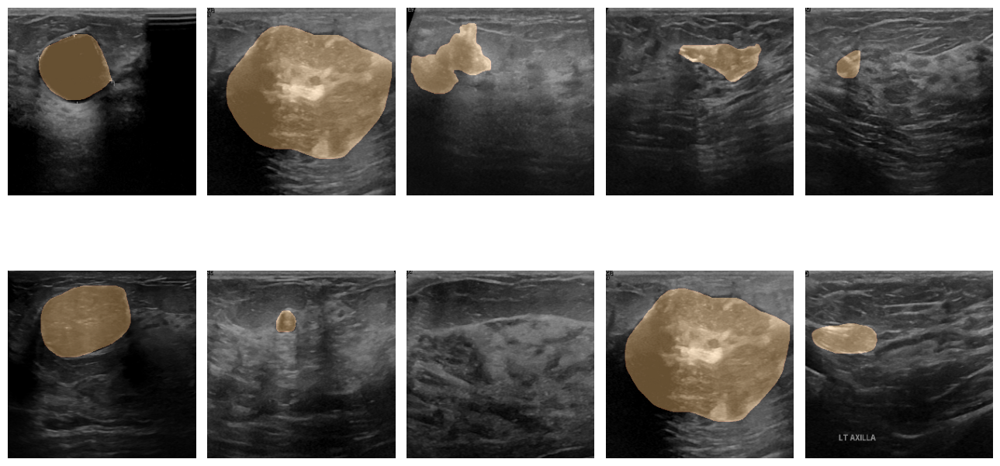

In [4]:
SIZE = 256

root_path = 'Dataset_BUSI_with_GT/'
classes = sorted(os.listdir(root_path))
classes

# Collecting paths and separating based on the classes in the dataset(benign, malignanat, normal)
single_mask_paths = sorted([sorted(glob(root_path + name + "/*mask.png")) for name in classes])
double_mask_paths = sorted([sorted(glob(root_path + name + "/*mask_1.png")) for name in classes])

# Prepping images/masks path to load and view them
image_paths = []
mask_paths = []
for class_path in single_mask_paths:
    for path in class_path:
        img_path = path.replace('_mask','')
        image_paths.append(img_path)
        mask_paths.append(path)

# Sample image w/ single mask 
show_image(load_image(image_paths[0], SIZE))
plt.show()

show_mask(load_image(image_paths[0], SIZE), load_image(mask_paths[0], SIZE)[:,:,0], alpha=0.6)
plt.show()

img = np.zeros((1,SIZE,SIZE,3))
mask1 = load_image('Dataset_BUSI_with_GT/benign/benign (25)_mask_1.png', SIZE)
mask2 = load_image('Dataset_BUSI_with_GT/benign/benign (25)_mask.png', SIZE)

# Merging masks for image w/ multiple 
img = img + mask1 + mask2
img = img[0,:,:,0]
show_image(img, cmap='binary')
show_image(img)

# Sample image w/ multiple masks in various color maps
show_image(load_image('Dataset_BUSI_with_GT/benign/benign (25).png', SIZE))
plt.imshow(img, cmap='gray', alpha=0.4)
plt.axis('off')
plt.show()

show_image(load_image('Dataset_BUSI_with_GT/benign/benign (25).png', SIZE))
plt.imshow(img, alpha=0.4)
plt.axis('off')
plt.show()

#Loading all images and masks
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

# Sample images w/ masks in three color maps
plt.figure(figsize=(13,8))
for i in range(10):
    plt.subplot(2,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='jet')
plt.tight_layout()
plt.show()

plt.figure(figsize=(13,8))
for i in range(10):
    plt.subplot(2,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='binary')
plt.tight_layout()
plt.show()

plt.figure(figsize=(13,8))
for i in range(10):
    plt.subplot(2,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='copper')
plt.tight_layout()
plt.show()

## Helper Classes
The below classes are helper classes that will support the creation of the attention u-net image segmetation model. The Encoder class will reduce the spatial dimensions in every layer and increases the channels, while the Decoder class will do the reverse, increase the spatial dimensions while reducing the channels. The AttentionGate class, which works with the decoder to make this an attention u-net model, will allow the model to automatically learn to focus on target structures of varying shapes and sizes and suppress irrelevant regions within an input image while also highlighting salient features our target structures (tumors). There is also a ShowProgress class to show predicted mask and GradCAM, along with the original mask, of input images after each epoch of the model.  

In [5]:
class Encoder(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(Encoder, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }

class Decoder(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(Decoder, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = UpSampling2D()
        self.net = Encoder(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = concatenate([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }

class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D()
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }

class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        exp = GradCAM()
        image = images[id]
        mask = masks[id]
        pred_mask = self.model.predict(image[np.newaxis,...])
        cam = exp.explain(
            validation_data=(image[np.newaxis,...], mask),
            class_index=1,
            layer_name='Attention4',
            model=self.model
        )

        plt.figure(figsize=(10,5))

        plt.subplot(1,3,1)
        plt.title("Original Mask")
        show_mask(image, mask, cmap='copper')

        plt.subplot(1,3,2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='copper')

        plt.subplot(1,3,3)
        show_image(cam,title="GradCAM")

        plt.tight_layout()
        plt.show()

## Attention U-Net Model Building + Training

Epoch 1/18
1/1 [==============================] - 0s 331ms/step loss: 0.3394 - accuracy: 0.8995 - IoU: 0.45


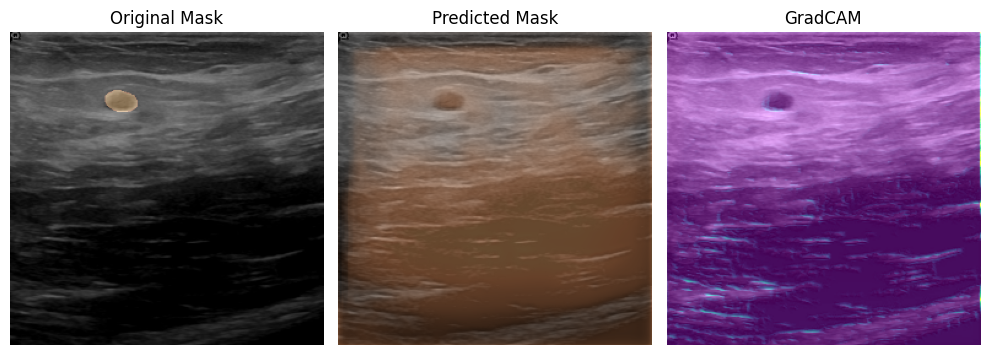

156/156 [==============================] - 39s 211ms/step - loss: 0.3394 - accuracy: 0.8995 - IoU: 0.4542 - val_loss: 0.2593 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 2/18
1/1 [==============================] - 0s 24ms/step- loss: 0.2458 - accuracy: 0.9098 - IoU: 0.45


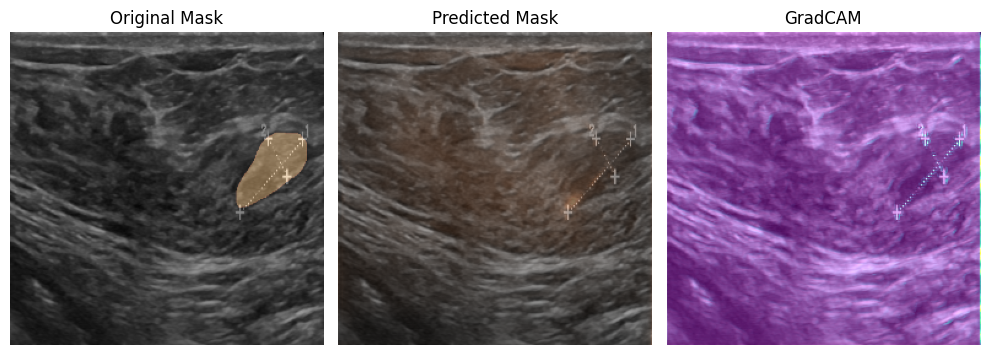

156/156 [==============================] - 25s 162ms/step - loss: 0.2458 - accuracy: 0.9098 - IoU: 0.4548 - val_loss: 0.1155 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 3/18
1/1 [==============================] - 0s 25ms/step- loss: 0.2163 - accuracy: 0.9190 - IoU: 0.45


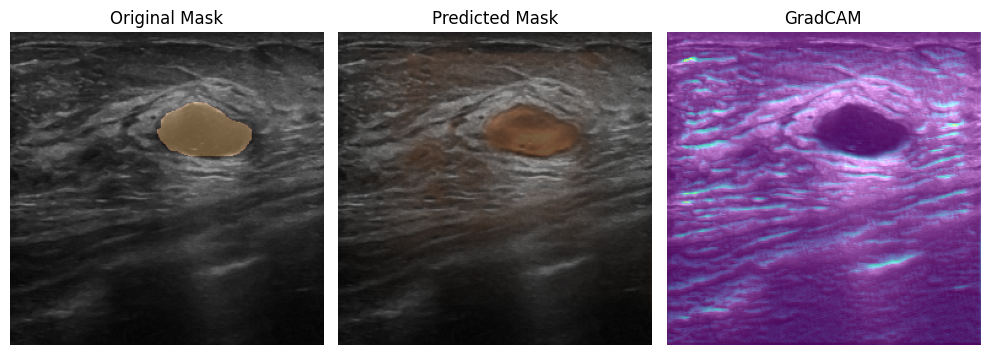

156/156 [==============================] - 25s 163ms/step - loss: 0.2163 - accuracy: 0.9190 - IoU: 0.4555 - val_loss: 0.0891 - val_accuracy: 0.9814 - val_IoU: 0.4909
Epoch 4/18
1/1 [==============================] - 0s 23ms/step- loss: 0.2073 - accuracy: 0.9214 - IoU: 0.45


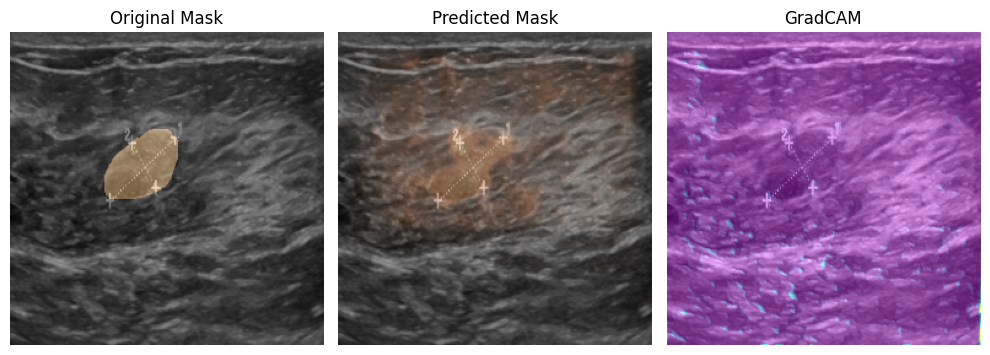

156/156 [==============================] - 25s 162ms/step - loss: 0.2073 - accuracy: 0.9214 - IoU: 0.4543 - val_loss: 0.1286 - val_accuracy: 0.9781 - val_IoU: 0.4909
Epoch 5/18
1/1 [==============================] - 0s 23ms/step- loss: 0.2033 - accuracy: 0.9235 - IoU: 0.45


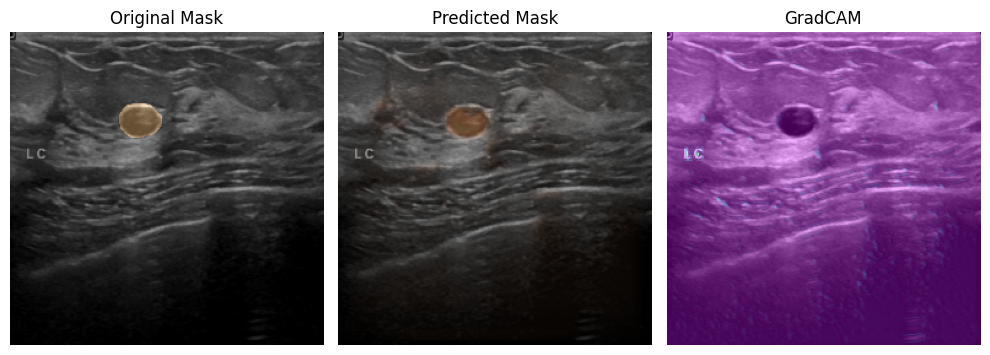

156/156 [==============================] - 25s 164ms/step - loss: 0.2033 - accuracy: 0.9235 - IoU: 0.4544 - val_loss: 0.0880 - val_accuracy: 0.9824 - val_IoU: 0.4909
Epoch 6/18
1/1 [==============================] - 0s 24ms/step- loss: 0.1938 - accuracy: 0.9267 - IoU: 0.45


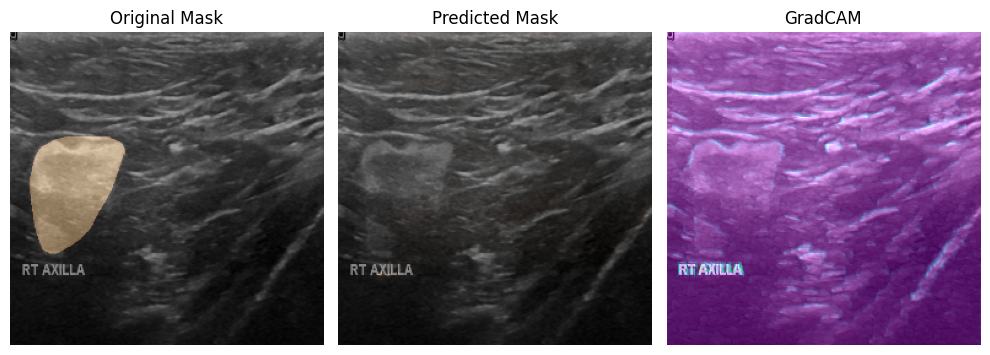

156/156 [==============================] - 26s 164ms/step - loss: 0.1938 - accuracy: 0.9267 - IoU: 0.4549 - val_loss: 0.0836 - val_accuracy: 0.9815 - val_IoU: 0.4909
Epoch 7/18
1/1 [==============================] - 0s 25ms/step- loss: 0.1893 - accuracy: 0.9295 - IoU: 0.45


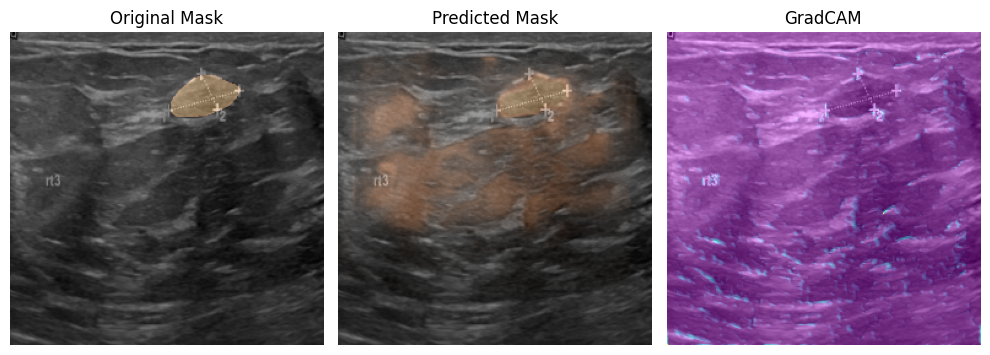

156/156 [==============================] - 25s 162ms/step - loss: 0.1893 - accuracy: 0.9295 - IoU: 0.4557 - val_loss: 0.1872 - val_accuracy: 0.9137 - val_IoU: 0.4909
Epoch 8/18
1/1 [==============================] - 0s 25ms/step- loss: 0.1936 - accuracy: 0.9275 - IoU: 0.45


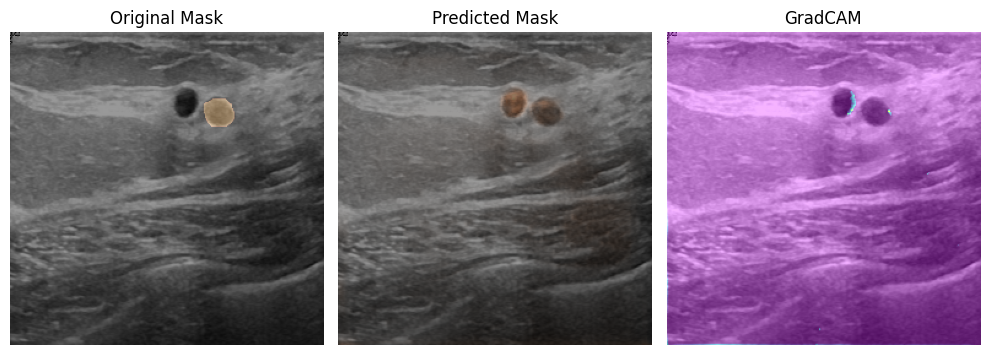

156/156 [==============================] - 25s 163ms/step - loss: 0.1936 - accuracy: 0.9275 - IoU: 0.4554 - val_loss: 0.0942 - val_accuracy: 0.9815 - val_IoU: 0.4909
Epoch 9/18
1/1 [==============================] - 0s 24ms/step- loss: 0.1950 - accuracy: 0.9276 - IoU: 0.45


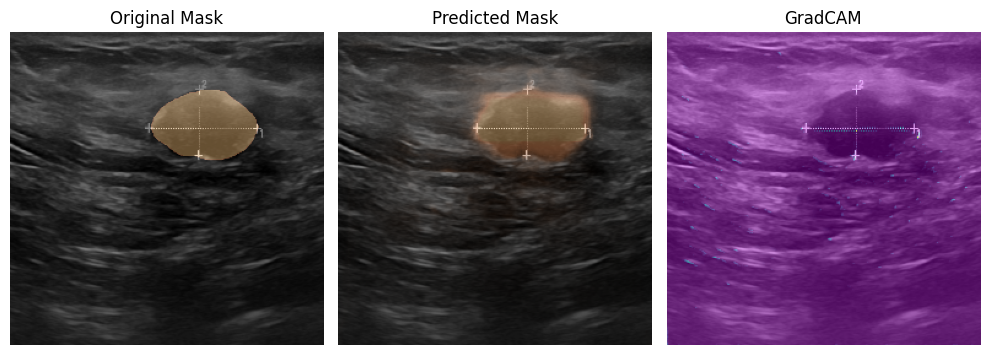

156/156 [==============================] - 26s 164ms/step - loss: 0.1950 - accuracy: 0.9276 - IoU: 0.4551 - val_loss: 0.0765 - val_accuracy: 0.9819 - val_IoU: 0.4909
Epoch 10/18
1/1 [==============================] - 0s 26ms/step- loss: 0.1875 - accuracy: 0.9320 - IoU: 0.45


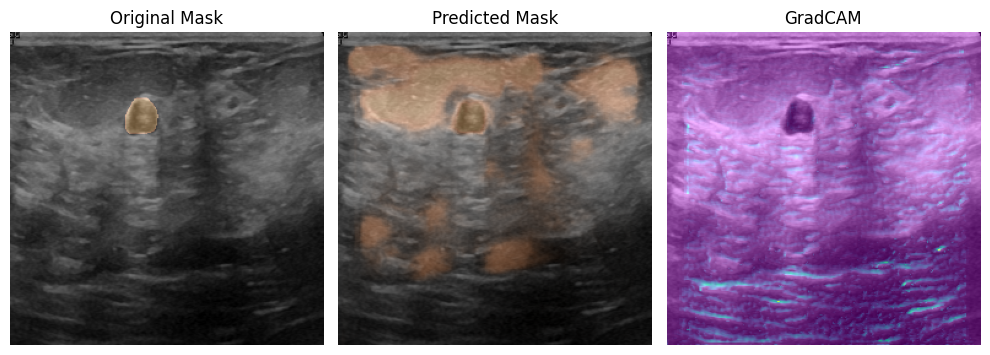

156/156 [==============================] - 25s 163ms/step - loss: 0.1875 - accuracy: 0.9320 - IoU: 0.4569 - val_loss: 0.2331 - val_accuracy: 0.8834 - val_IoU: 0.4909
Epoch 11/18
1/1 [==============================] - 0s 27ms/step- loss: 0.1817 - accuracy: 0.9315 - IoU: 0.45


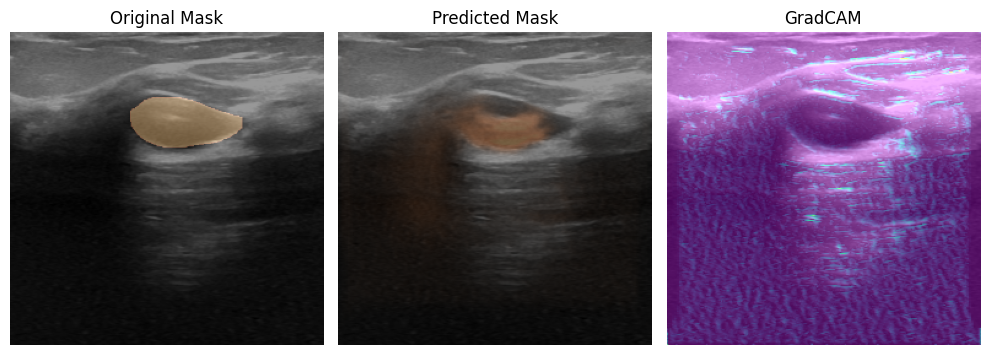

156/156 [==============================] - 26s 164ms/step - loss: 0.1817 - accuracy: 0.9315 - IoU: 0.4550 - val_loss: 0.0793 - val_accuracy: 0.9817 - val_IoU: 0.4909
Epoch 12/18
1/1 [==============================] - 0s 26ms/step- loss: 0.1777 - accuracy: 0.9345 - IoU: 0.45


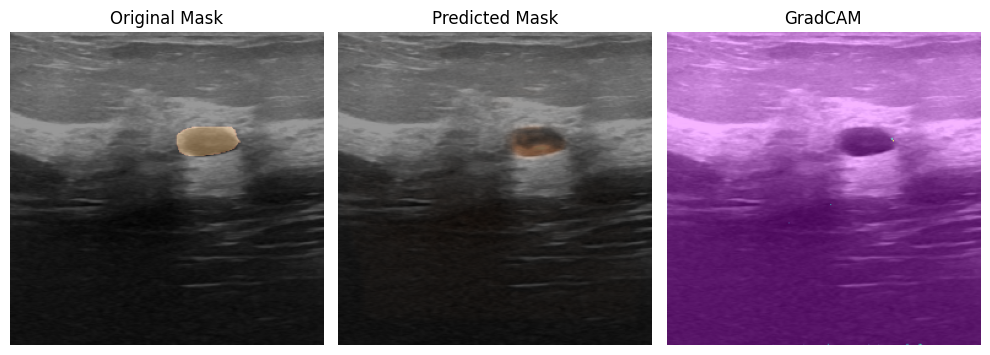

156/156 [==============================] - 26s 166ms/step - loss: 0.1777 - accuracy: 0.9345 - IoU: 0.4548 - val_loss: 0.0796 - val_accuracy: 0.9811 - val_IoU: 0.4909
Epoch 13/18
1/1 [==============================] - 0s 24ms/step- loss: 0.1762 - accuracy: 0.9342 - IoU: 0.45


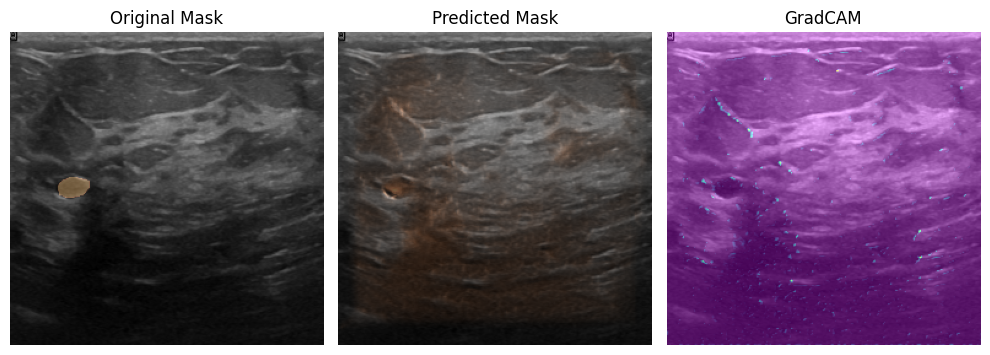

156/156 [==============================] - 26s 167ms/step - loss: 0.1762 - accuracy: 0.9342 - IoU: 0.4536 - val_loss: 0.0659 - val_accuracy: 0.9851 - val_IoU: 0.4909
Epoch 14/18
1/1 [==============================] - 0s 29ms/step- loss: 0.1573 - accuracy: 0.9435 - IoU: 0.45


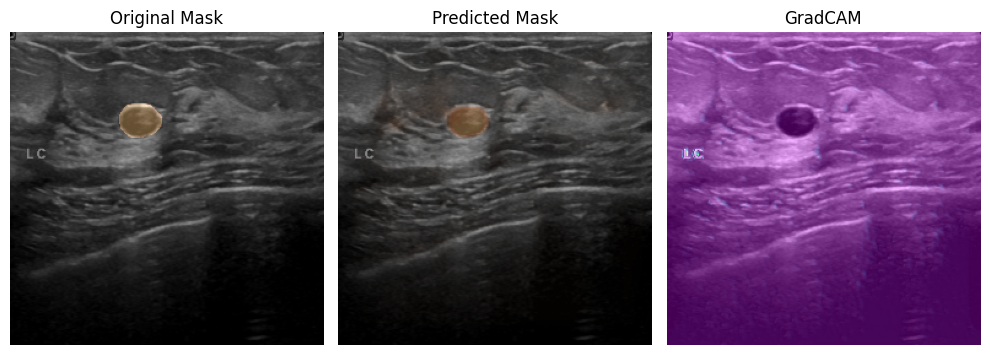

156/156 [==============================] - 26s 168ms/step - loss: 0.1573 - accuracy: 0.9435 - IoU: 0.4576 - val_loss: 0.0734 - val_accuracy: 0.9824 - val_IoU: 0.4909
Epoch 15/18
1/1 [==============================] - 0s 28ms/step


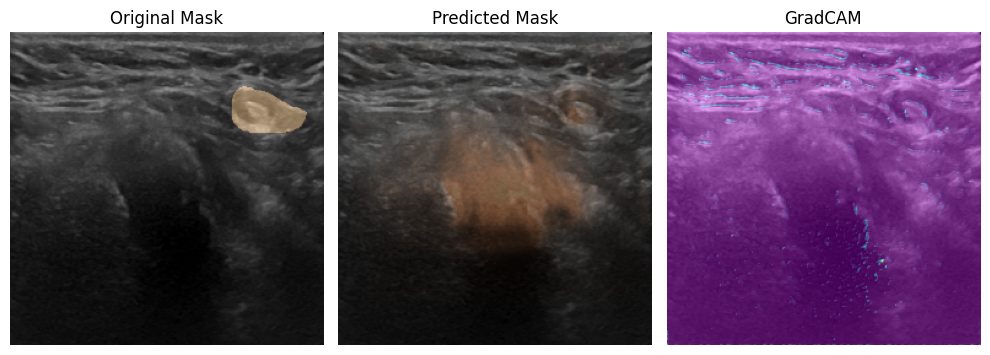

156/156 [==============================] - 12s 76ms/step - loss: 0.1609 - accuracy: 0.9419 - IoU: 0.4561 - val_loss: 0.0770 - val_accuracy: 0.9819 - val_IoU: 0.4909


In [7]:
# Images Inputs
input_layer = Input(shape=images.shape[-3:])

# Encoder
p1, c1 = Encoder(32,0.1, name="Encoder1")(input_layer)
p2, c2 = Encoder(64,0.1, name="Encoder2")(p1)
p3, c3 = Encoder(128,0.2, name="Encoder3")(p2)
p4, c4 = Encoder(256,0.2, name="Encoder4")(p3)

# Encoding
encoding = Encoder(512,0.3, pooling=False, name="Encoding")(p4)

# Attention + Decoder
a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = Decoder(256,0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = Decoder(128,0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = Decoder(64,0.1, name="Decoder3")([d2, a3])

a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = Decoder(32,0.1, name="Decoder4")([d3, a4])

# Output 
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)

# Model
model = Model(
    inputs=[input_layer],
    outputs=[output_layer]
)

# Compile
model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy', MeanIoU(num_classes=2, name='IoU')]
)

# Callbacks
cb = [
#     EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint("AttentionUNetBCUS.h5", save_best_only=True),
    ShowProgress()
]

# Config Training
BATCH_SIZE = 5
SPE = len(images)//BATCH_SIZE

# Training
results = model.fit(
    images, masks,
    validation_split=0.2,
    epochs=18, # 15 will be enough for a good Model for better model go with 20+
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

## Testing the Model

1/1 [==============================] - 0s 21ms/step


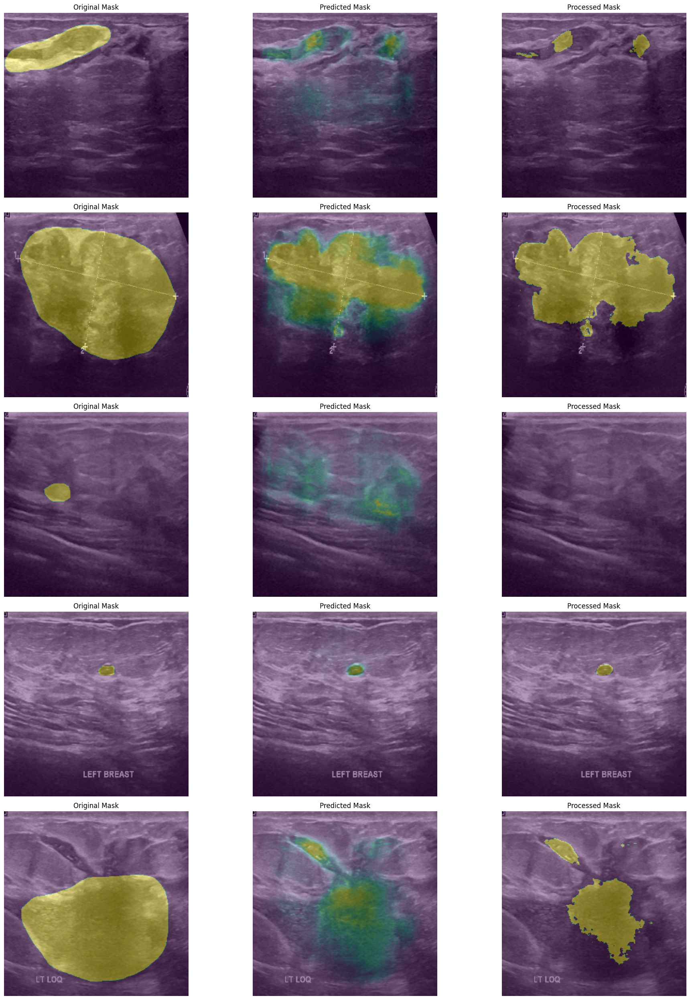

In [8]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(images))
        image = images[id]
        mask = masks[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()